# Trexquant-2025 Summer Intern Challenge-BITS Pilani

**Name : Anjaneya Bajaj**\
**ID : 2022A7PS0164P**\
**Email : f20220164@pilani.bits-pilani.ac.in**

## Imports and Settings

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tabulate import tabulate
import random
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import TimeSeriesSplit, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
import lightgbm as lgb
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import VotingRegressor, StackingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [3]:
# pandas settings
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 2000)
pd.set_option('display.float_format', '{:20.2f}'.format)
pd.set_option('display.max_colwidth', None)
# seeds for reproducibility
random.seed(42)
np.random.seed(42)

## Loading the data and exploring 

- We note that we have 105442 entries in the training data - all are uniquely identified by a row_id, have 87 features and a target value.
- The data is already normalized as stated in the problem statement.
- We calculate statistics like mean, median, percentiles etc. to get an idea about the data.
- Based on manual observation, almost every feature's data is a floating point integer value and lies between -4.0 and 4.0.
- Histograms were drawn to visualise the distribution of values in some selected features. 
- Similarly, plots were drawn of feature values vs time - but this did not give any insights due to nature of the data.
- Attempted to find time series patterns.
    - First, I tried to decompose some select features as a time series as seasonlity, trends and noise using different values of period - this largely failed and the time series appears to be stationary.
    - A statistical methodology, the ADF (Augmented Dickey-Fuller) test was then used on these features - it confirmed the same result that the time series was stationary.
- Plotted a correlation hatmap of all features to visualise the possibility of linear relationships between features - this however, showed that almost none of the variables had any linear relation between themselves. 

In [49]:
# loading in train data, test data as a dataframe
df_train = pd.read_csv('TQ_Train_Kaggle.csv')
df_test = pd.read_csv('TQ_Test_Kaggle.csv')

# observing the first 5 rows of the data and some info about each features
print(df_train.info())
df_train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105442 entries, 0 to 105441
Data columns (total 89 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   row_id  105442 non-null  int64  
 1   f1      105442 non-null  float64
 2   f2      105442 non-null  float64
 3   f3      34154 non-null   float64
 4   f4      105442 non-null  float64
 5   f5      105442 non-null  float64
 6   f6      105442 non-null  float64
 7   f7      28839 non-null   float64
 8   f8      92381 non-null   float64
 9   f9      105442 non-null  float64
 10  f10     105442 non-null  float64
 11  f11     105442 non-null  float64
 12  f12     61142 non-null   float64
 13  f13     74474 non-null   float64
 14  f14     86453 non-null   float64
 15  f15     86503 non-null   float64
 16  f16     92122 non-null   float64
 17  f17     105442 non-null  float64
 18  f18     105442 non-null  float64
 19  f19     105442 non-null  float64
 20  f20     8085 non-null    float64
 21  f21     68

,row_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,NaN,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,NaN,0.77,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,NaN,0.72,0.62,-1.01,-0.97,0.02,NaN,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,NaN,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,NaN,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,NaN,-2.11,NaN,NaN,0.66,0.96,NaN,NaN,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,NaN,0.91,-0.97,-0.77,-0.97,0.02,NaN,0.01,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,NaN,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,NaN,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,NaN,0.99,NaN,NaN,0.67,0.46,NaN,NaN,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,NaN,1.52,0.68,-0.85,0.37,0.02,NaN,0.11,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,NaN,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,NaN,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,0.93,-0.98,-0.04,NaN,NaN,NaN,NaN,NaN,-0.09,NaN,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,NaN,0.10,NaN,NaN,0.81,0.65,NaN,NaN,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,NaN,1.41,0.02,2.46,-0.97,0.02,-1.61,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,NaN,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,NaN,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,1.71,0.42,-0.83,NaN,NaN,NaN,NaN,NaN,0.01,NaN,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,NaN,0.70,NaN,NaN,0.87,2.47,NaN,NaN,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,NaN,0.93,0.90,-1.49,0.40,0.02,NaN,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,NaN,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06


In [5]:
# printing some statistics about the data
def custom_describe(df):
    result = pd.DataFrame({
        'count': df.count(),
        'mean': df.mean(),
        'std': df.std(),
        'min': df.min(),
        'max': df.max(),
        '25%': df.quantile(0.25),
        '50% / median': df.median(),
        '75%': df.quantile(0.75),
        'positive_count': (df > 0).sum(),
        'negative_count': (df < 0).sum(),
        'zero_count': (df == 0).sum(),
        'nan_count': df.isna().sum(),
    })
    return result.transpose()

custom_stats = custom_describe(df_train)
print(tabulate(custom_stats, headers='keys', tablefmt='pretty', floatfmt='.4f'))

+----------------+--------------------+----------------------+----------------------+---------------------+---------------------+--------------------+-----------------------+----------------------+----------------------+----------------------+---------------------+---------------------+---------------------+----------------------+---------------------+---------------------+---------------------+------------------------+---------------------+----------------------+----------------------+----------------------+----------------------+---------------------+----------------------+----------------------+---------------------+----------------------+----------------------+-----------------------+---------------------+-----------------------+---------------------+--------------------+--------------------+--------------------+-----------------------+--------------------+----------------------+----------------------+----------------------+---------------------+---------------------+--------------

/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option i

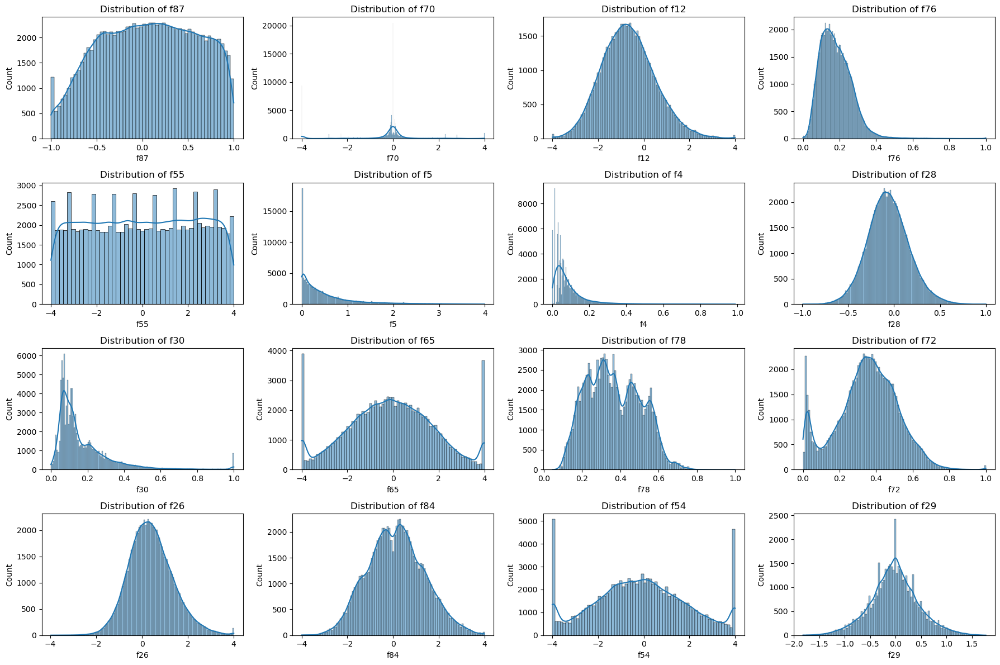

In [35]:
# Randomly select a subset of features and visualise the distribution of values
subset_size = 16
random_features = random.sample(list(df_train.columns[1:-1]), subset_size)  # Exclude row_id and target

# Plotting histograms
plt.figure(figsize=(18, 12))
for i, feature in enumerate(random_features):
    plt.subplot(4,4, i + 1) 
    sns.histplot(df_train[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.tight_layout()

plt.show()

/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_17684/2282675592.py:14: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


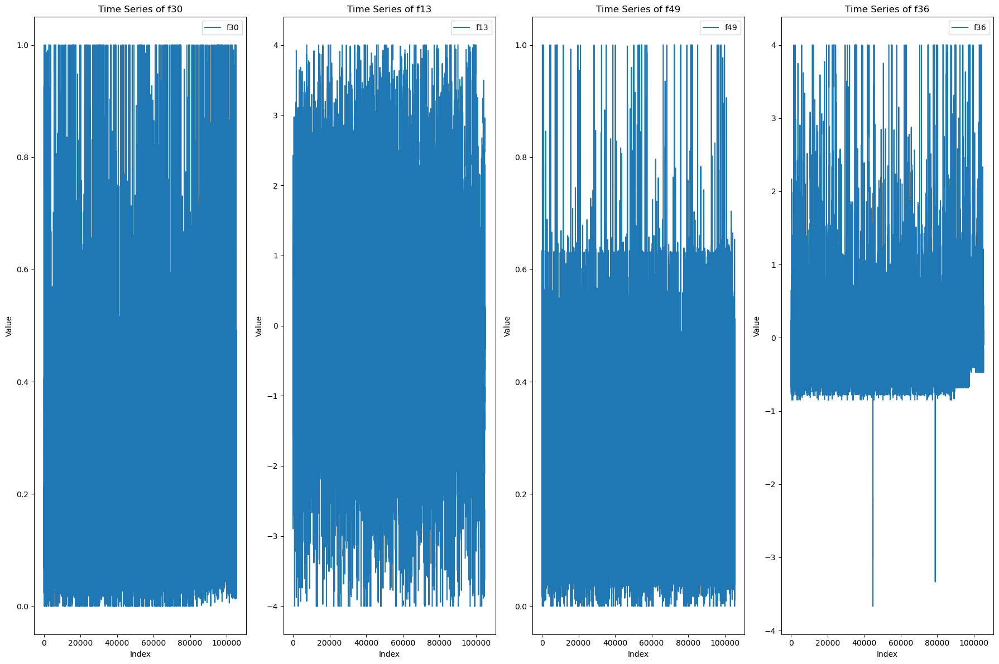

In [44]:
# Randomly select a subset of features and visualise their distribution with respect to time - impossible to find trends with visual inspection
subset_size = 4
random_features = random.sample(list(df_train.columns[1:-1]), subset_size)

# Plotting features with respect to time/sequence order
plt.figure(figsize=(18, 12))
for i, feature in enumerate(random_features):
    plt.subplot(1, 4, i + 1)
    plt.plot(df_train.index, df_train[feature], label=feature)
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Time Series of {feature}')
    plt.legend()
    plt.tight_layout()

plt.show()

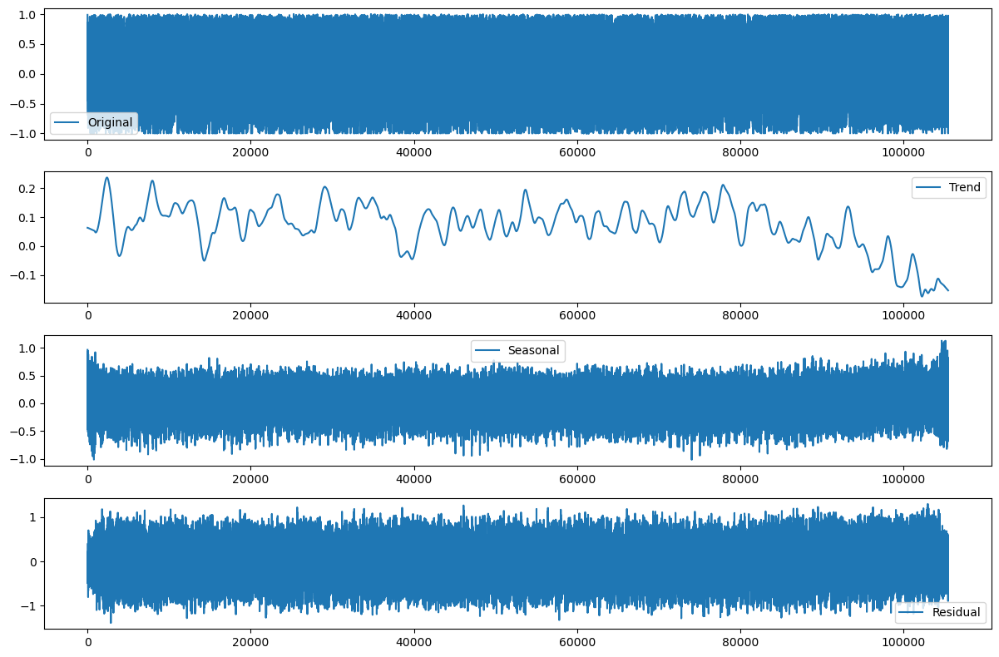

In [46]:
# decomposing a feature into trend, seasonal and residual components and plotting 
def decompose_and_plot(series, period):
    stl = STL(series, period=period)
    result = stl.fit()
    
    plt.figure(figsize=(12, 8))
    plt.subplot(4, 1, 1)
    plt.plot(series, label='Original')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(result.trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(result.seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(result.resid, label='Residual')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Example usage for a feature
decompose_and_plot(df_train['f87'], period=1000)

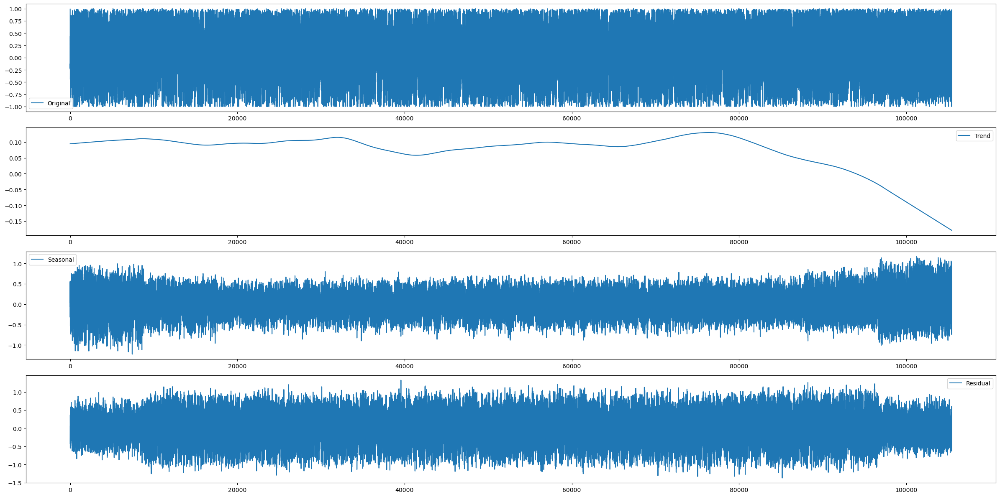

In [47]:
def decompose_and_plot(series, period):
    stl = STL(series, period=period)
    result = stl.fit()
    
    plt.figure(figsize=(24, 12))
    plt.subplot(4, 1, 1)
    plt.plot(series, label='Original')
    plt.legend()
    
    plt.subplot(4, 1, 2)
    plt.plot(result.trend, label='Trend')
    plt.legend()
    
    plt.subplot(4, 1, 3)
    plt.plot(result.seasonal, label='Seasonal')
    plt.legend()
    
    plt.subplot(4, 1, 4)
    plt.plot(result.resid, label='Residual')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Example usage for a feature
decompose_and_plot(df_train['f87'], period=8760) # 24 * 365 - Assuming hourly data over an year

In [48]:
# statistical test to check if time series is stationary
def adfuller_test(series):
    result = adfuller(series.dropna(), autolag='AIC')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:', result[4])

adfuller_test(df_train['f87'])


ADF Statistic: -33.466887576226924
p-value: 0.0
Critical Values: {'1%': -3.4304120565700833, '5%': -2.861567428047167, '10%': -2.566784598987048}


In [52]:
adfuller_test(df_train['f12'])

ADF Statistic: -45.94946491037882
p-value: 0.0
Critical Values: {'1%': -3.4304570044127263, '5%': -2.861587293942403, '10%': -2.5667951729683796}


In [53]:
adfuller_test(df_train['f76'])

ADF Statistic: -36.098297345524
p-value: 0.0
Critical Values: {'1%': -3.4304359377707563, '5%': -2.86157798301681, '10%': -2.5667902170536414}


In [54]:
adfuller_test(df_train['f28'])

ADF Statistic: -40.470565505095024
p-value: 0.0
Critical Values: {'1%': -3.4304207621235348, '5%': -2.861571275721688, '10%': -2.5667866469771736}


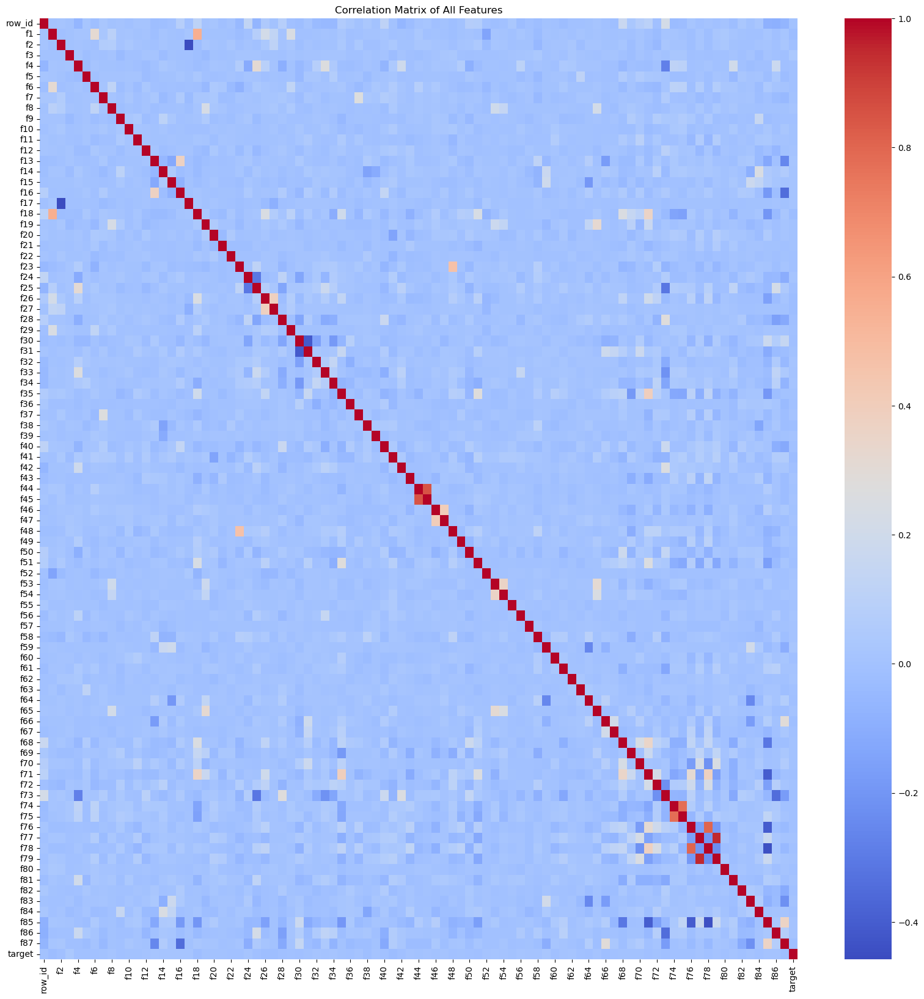

In [75]:
# Compute the full correlation matrix
correlation_matrix = df_train.corr()

# Plot heatmap of the full correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title('Correlation Matrix of All Features')
plt.show()

## Handling Missing Values and Outliers

- 65 features have some values missing - the percentages of the same have been listed in the below cells.
- Considered multiples methods to handle missing values.
    - Using a constant value or some other measure like mean, mode, median would result in the loss of distribution of data.
    - k-Nearest neighbours imputation may not be appropriate due to the high dimensionality of the data.
    - Decomposing a feature into a time series with trends and seasonlity does not make much sense either as we have reason to believe the features are stationary time series.
    - Rolling averages may work but might suffer due to large gaps between entries in some features.
    - We thus finally use Last Observation Carried Forward method.
    - However, this was not sufficient if the first few values of the features were empty - so we also used Next Observation Carried Backward (NOCB) after LOCF. Note that it was used for a very small number of values in only a few features (<0.04%) and would not introduce any significant bias.
- Calculated number of outliers on a per feature basis and visualised some features as boxplots.
- Decided not to remove outliers as:
    - The removal of all outliers based on standard metric like z-score/ Inter-Quartile Range meant a huge loss of data.
    - We also know that all values lie in a reasonable range of -4 to 4, which should not create any significant bias while using the data for predictions.

In [36]:
# Identify missing values, percentage
missing_summary = df_train.isnull().sum().sort_values(ascending=False)
missing_percent = 100 * df_train.isnull().sum() / len(df_train)
missing_table = pd.concat([missing_summary, missing_percent], axis=1, keys=['Total', 'Percent'])

# Features with missing data
missing_features = missing_table[missing_table['Total'] > 0]

print("Missing Value Analysis:")
print(missing_features)

Missing Value Analysis:
      Total              Percent
f41  103469                98.13
f38   97477                92.45
f20   97357                92.33
f73   90871                86.18
f62   85710                81.29
f80   84017                79.68
f47   83046                78.76
f46   81920                77.69
f56   80495                76.34
f7    76603                72.65
f40   75125                71.25
f3    71288                67.61
f63   67962                64.45
f29   56821                53.89
f22   53868                51.09
f37   50124                47.54
f81   45106                42.78
f12   44300                42.01
f71   43633                41.38
f49   42741                40.54
f86   41953                39.79
f44   41817                39.66
f45   41796                39.64
f21   37336                35.41
f13   30968                29.37
f76   29299                27.79
f66   20448                19.39
f69   20168                19.13
f82   19370        

/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


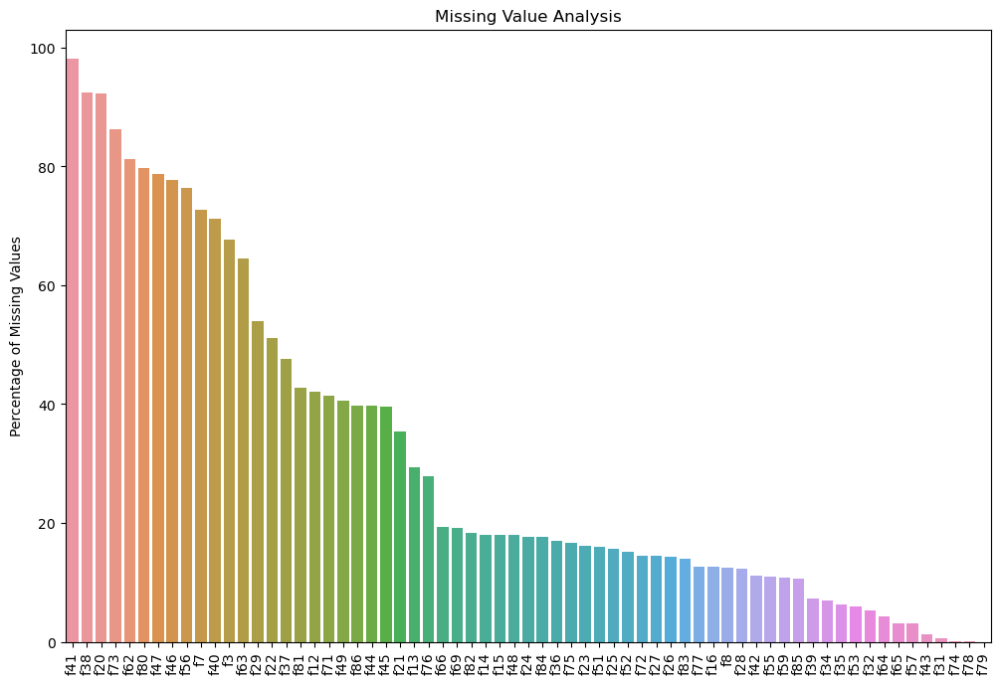

In [37]:
# Plotting missing values 
plt.figure(figsize=(12, 8))
sns.barplot(x=missing_features.index, y=missing_features['Percent'])
plt.xticks(rotation=90)
plt.ylabel('Percentage of Missing Values')
plt.title('Missing Value Analysis')
plt.show()

In [28]:
# Last observation carried forward (LOCF) imputation
df_filled = df_train.ffill()

In [30]:
# Next observation carried Backward (NOCB) imputation
df_filled = df_filled.bfill()

In [31]:
# Confirming that missing values are handled
missing_summary = df_filled.isnull().sum().sort_values(ascending=False)
missing_percent = 100 * df_filled.isnull().sum() / len(df_filled)
missing_table = pd.concat([missing_summary, missing_percent], axis=1, keys=['Total', 'Percent'])

missing_features = missing_table[missing_table['Total'] > 0]

print("Missing Value Analysis:")
print(missing_features)

Missing Value Analysis:
Empty DataFrame
Columns: [Total, Percent]
Index: []


In [ ]:
# Compute IQR, detect outliers
def detect_outliers_iqr(df, features):
    outliers = {}
    for feature in features:
        Q1 = df[feature].quantile(0.25)
        Q3 = df[feature].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[feature] = ((df[feature] < lower_bound) | (df[feature] > upper_bound)).sum()
    return outliers

features = df_filled.columns[(df_filled.columns != 'target') & (df_filled.columns != 'row_id')]
outliers_iqr = detect_outliers_iqr(df_filled, features)

outlier_summary_iqr = pd.DataFrame({
    'Feature': features,
    'Outliers (IQR)': [outliers_iqr[feature] for feature in features]
})
print(outlier_summary_iqr)

   Feature  Outliers (IQR)
0       f1            3223
1       f2            1819
2       f3               0
3       f4            7048
4       f5            7545
5       f6               0
6       f7            3961
7       f8               6
8       f9            3466
9      f10            8857
10     f11            5668
11     f12            1316
12     f13            8787
13     f14            3322
14     f15            9847
15     f16            1383
16     f17               0
17     f18            1738
18     f19            1907
19     f20             244
20     f21            2731
21     f22            4316
22     f23            1705
23     f24               0
24     f25            1153
25     f26            1653
26     f27               0
27     f28            1285
28     f29            1805
29     f30            6304
30     f31           17065
31     f32           25405
32     f33           18455
33     f34            2745
34     f35             604
35     f36           12476
3

/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_38137/1485345880.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_38137/1485345880.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_38137/1485345880.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_38137/1485345880.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_38137/1485345880.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_38137/1485345880.py:12: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/var/folders/sp/k1nmj7js7kn3bs6939gy7f800000gq/T/ipykernel_38137

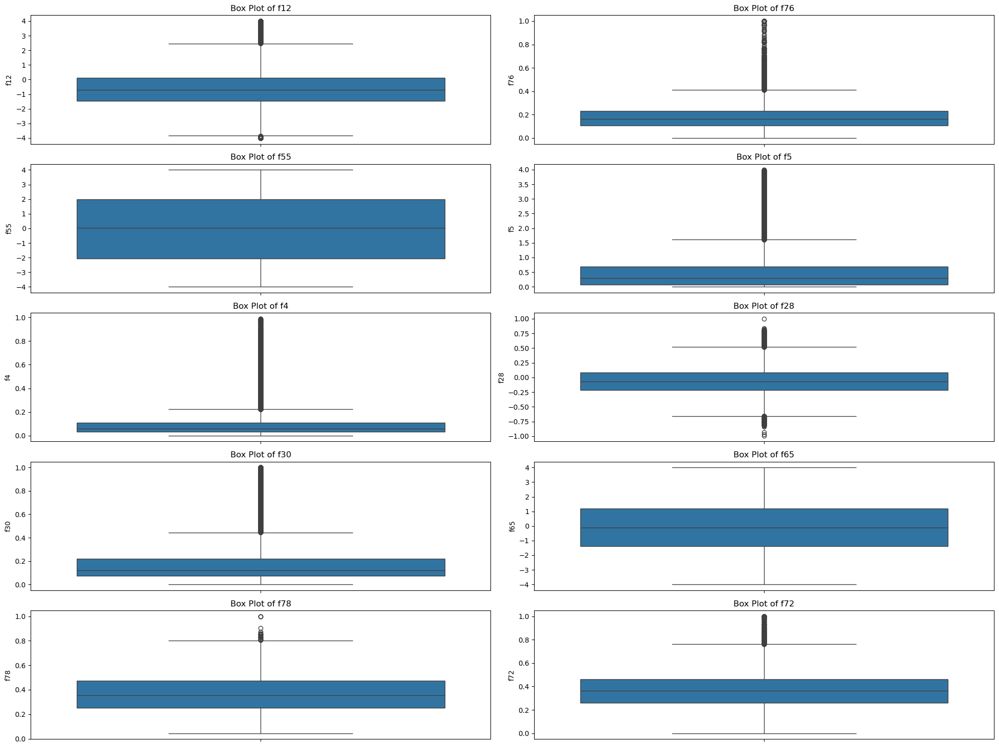

In [ ]:
# Plot box plots for a subset of features
subset_features = random.sample(list(features), 10)

plt.figure(figsize=(20, 15))
for i, feature in enumerate(subset_features):
    plt.subplot(5, 2, i + 1)
    sns.boxplot(df_filled[feature])
    plt.title(f'Box Plot of {feature}')
    plt.tight_layout()

plt.show()

## Visualising Target Variable

- Plotted a histogram of the target variable.
- Used scatter plots to visualise the distribution of some features vs the target - could not gain much insight visually due to extremely large number of value.
- Used scatter plots to plot pairs of various features along with the target to observe any patterns.
- Computed the correlation matrix of all features vs the target - all features had low correlation values i.e a weak/non-existent linear relationship with the target.
- Calculated the minimum and maximum feature variance.

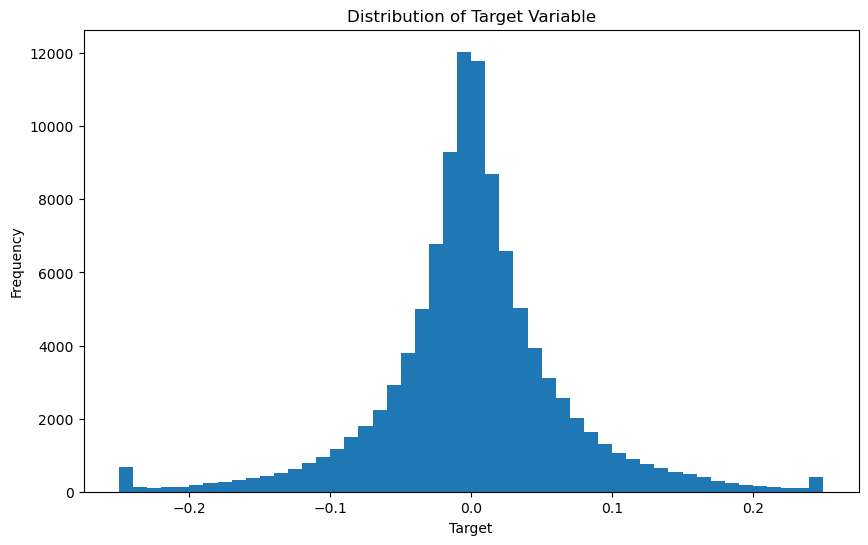

In [56]:
# Histogram of the target variable
plt.figure(figsize=(10, 6))
plt.hist(df_filled['target'], bins=50)
plt.title('Distribution of Target Variable')
plt.xlabel('Target')
plt.ylabel('Frequency')
plt.show()

/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecat

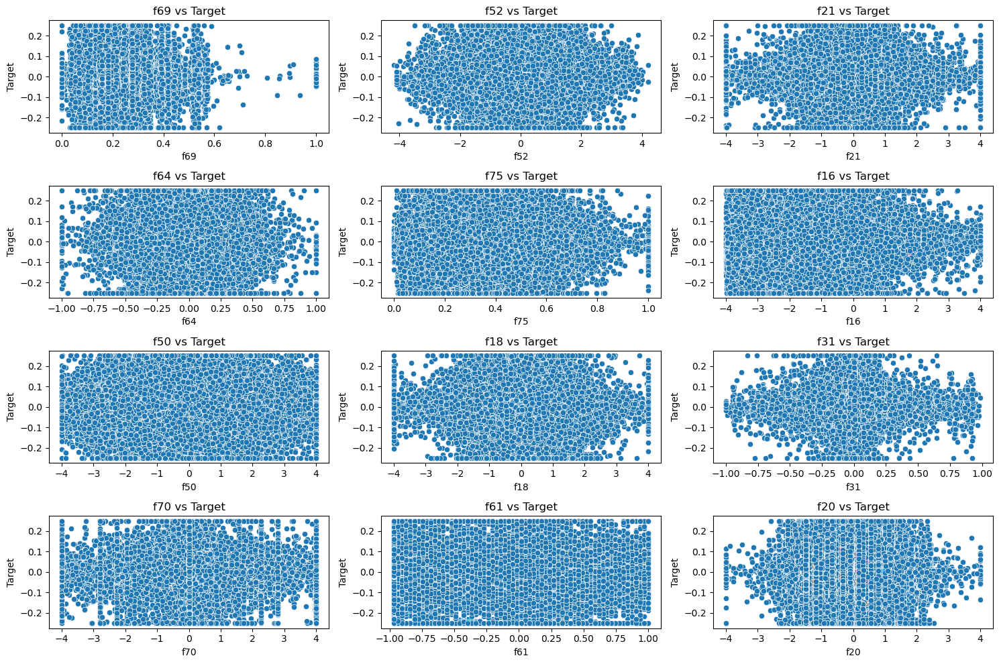

In [60]:
# scatter plots of target vs features
subset_size = 12
random_features = np.random.choice(df_filled.columns[(df_filled.columns != 'target') & (df_filled.columns != 'row_id')], subset_size, replace=False)

plt.figure(figsize=(15, 10))
for i, feature in enumerate(random_features):
    plt.subplot(4, 3, i + 1) 
    sns.scatterplot(x=df_filled[feature], y=df_filled['target'])
    plt.title(f'{feature} vs Target')
    plt.xlabel(feature)
    plt.ylabel('Target')

plt.tight_layout()
plt.show()

/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecat

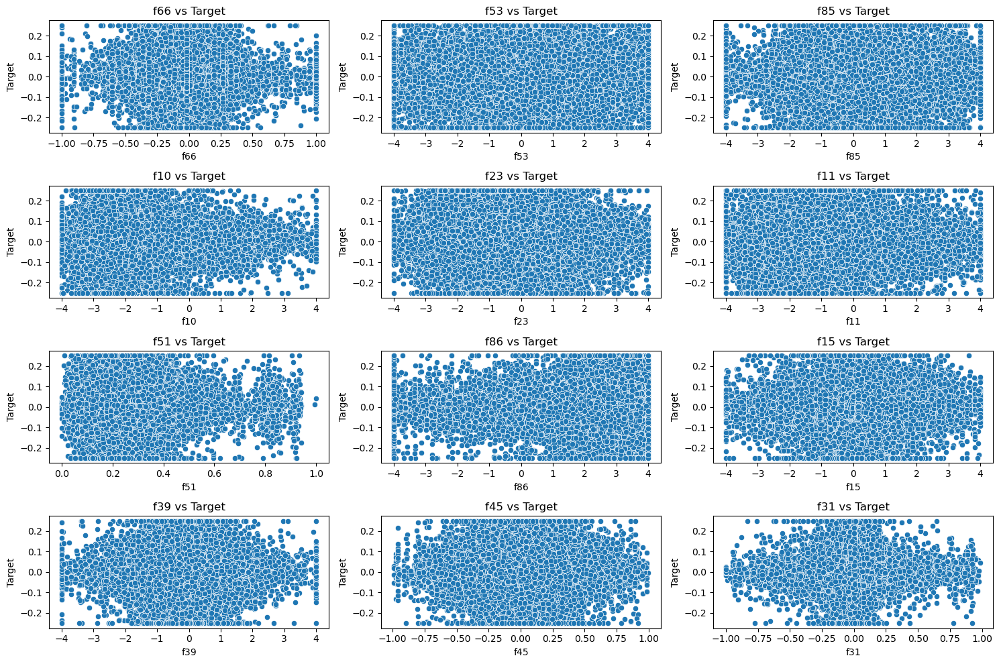

In [ ]:
# scatter plots of target vs features
subset_size = 12
random_features = np.random.choice(df_filled.columns[(df_filled.columns != 'target') & (df_filled.columns != 'row_id')], subset_size, replace=False)

plt.figure(figsize=(15, 10))
for i, feature in enumerate(random_features):
    plt.subplot(4, 3, i + 1)
    sns.scatterplot(x=df_filled[feature], y=df_filled['target'])
    plt.title(f'{feature} vs Target')
    plt.xlabel(feature)
    plt.ylabel('Target')

plt.tight_layout()
plt.show()

/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/anjaneyabajaj/anaconda3/envs/ML_env/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecat

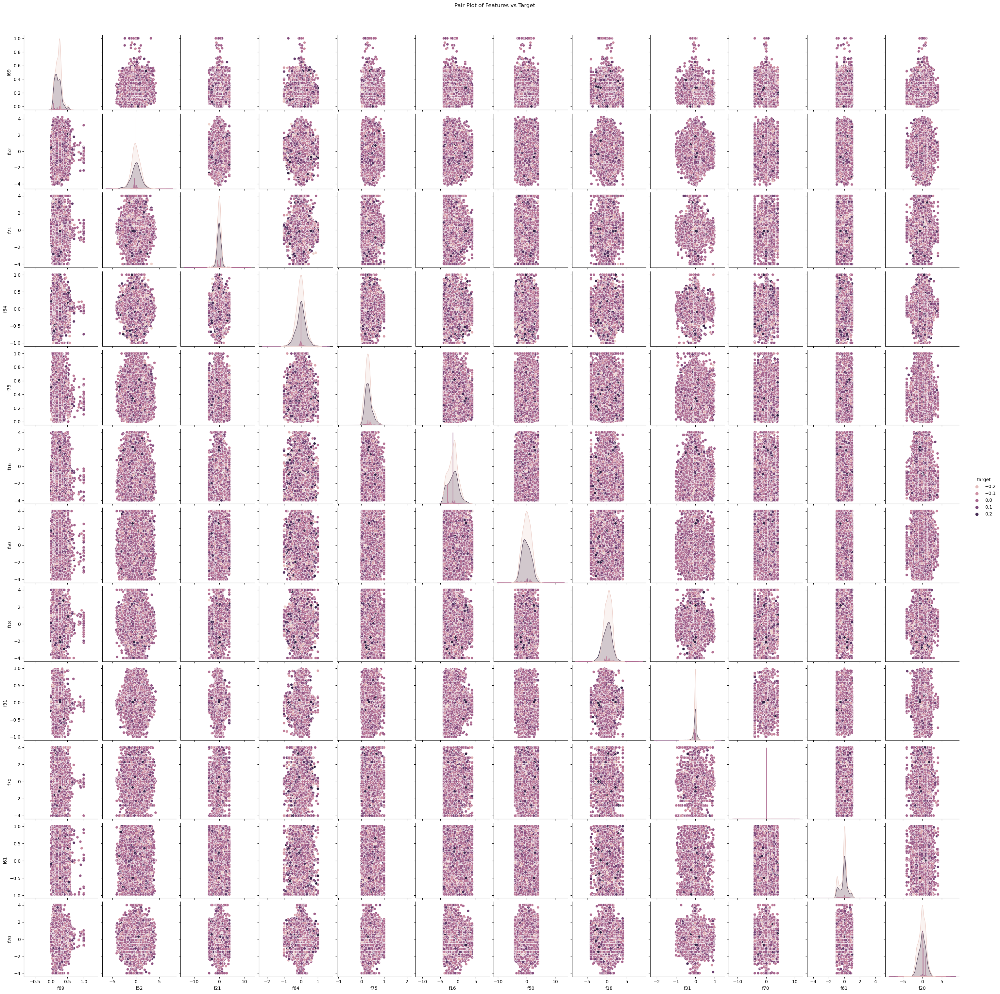

In [61]:
# Pair plots of features and target
df_pair_plot = df_filled.copy()
df_pair_plot['target'] = df_filled['target']

pair_plot_features = np.append(random_features, 'target')

sns.pairplot(df_pair_plot[pair_plot_features], diag_kind='kde', hue='target')
plt.suptitle('Pair Plot of Features vs Target', y=1.02)
plt.show()

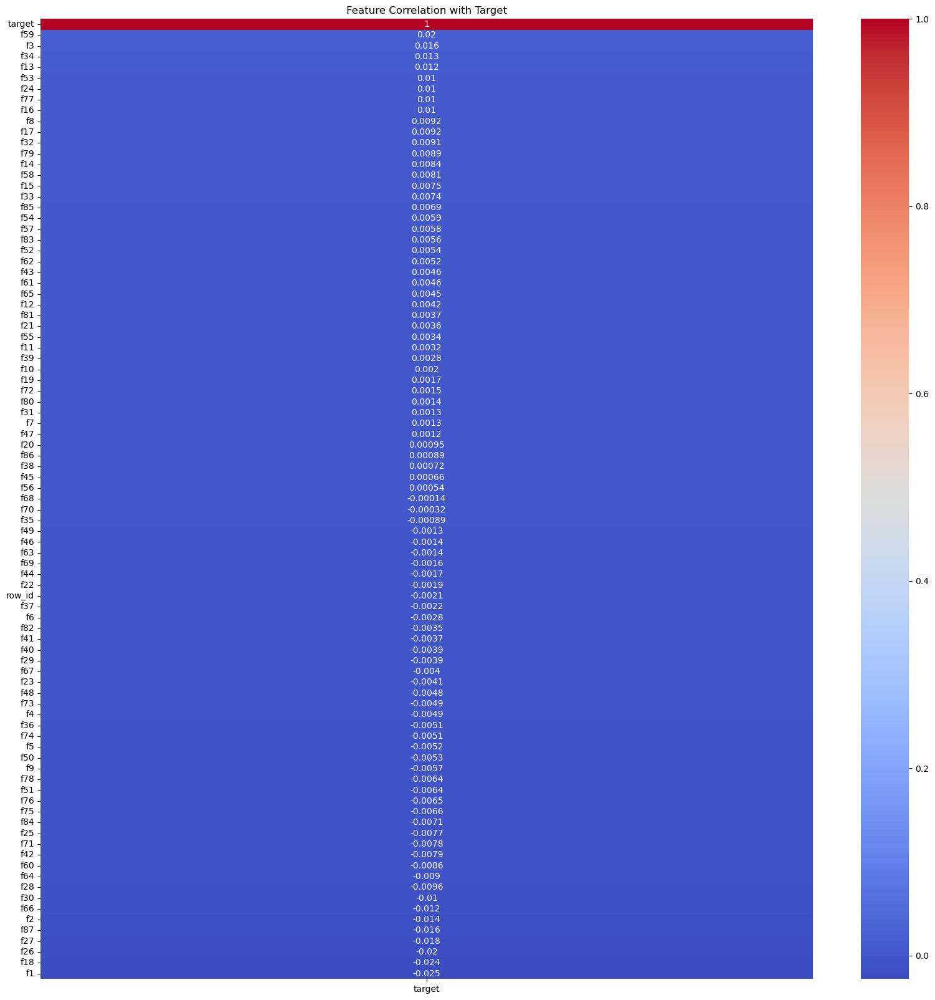

In [65]:
# Compute correlation matrix
correlation_matrix = df_filled.corr()

# Plot heatmap of correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix[['target']].sort_values(by='target', ascending=False), annot=True, cmap='coolwarm')
plt.title('Feature Correlation with Target')
plt.show()

In [34]:
# variance range of features
feature_variances = df_filled.drop(['row_id', 'target'], axis=1).var()
print("Variance range:")
print(f"Min variance: {feature_variances.min()}")
print(f"Max variance: {feature_variances.max()}")

Variance range:
Min variance: 0.0030396883412035247
Max variance: 5.339728010160907


## Dimensionality Reduction

- The large number of dimensions of our dataset pushes us to use methods to decrease the dimensionality.
- The data is scaled for performing PCA.
- We first attempt to visualise our data in lower dimensions by applying principal component analysis and reducing it to just 2 dimensions.
- We plot another graph to observe amount of captured variance based on number of principal components being used. To preserve 95% variance we need 77 components, which is then applied to both the test and train dataset.
- Our datasets are now ready for use in models.

In [35]:
# Standardize the data
X = df_filled.drop(columns=['target']) 
y = df_filled['target']
X_standardized = StandardScaler().fit_transform(X)

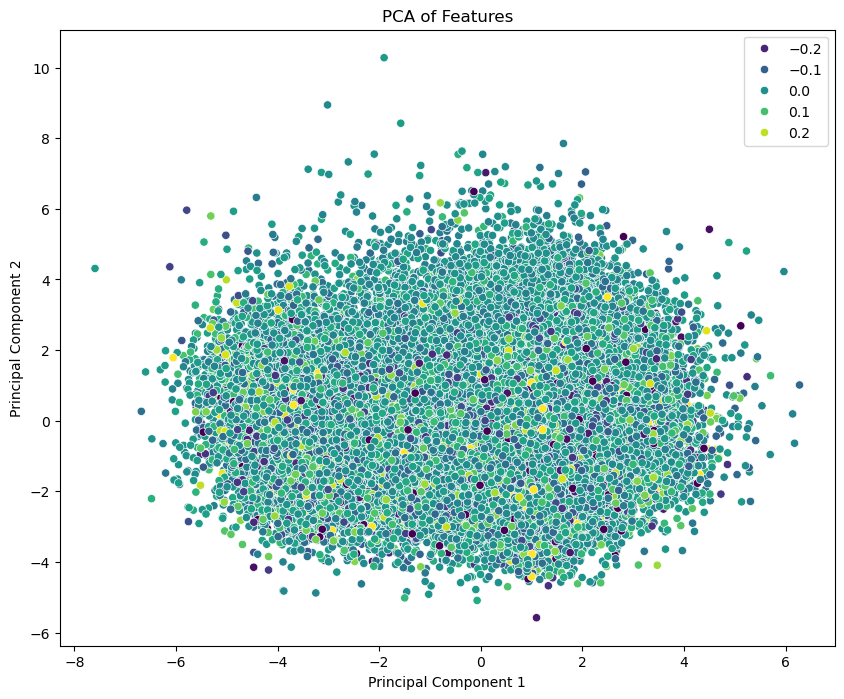

In [36]:
 # Reduce to 2 components for visualization using PCA
pca = PCA(n_components=2) 
X_pca = pca.fit_transform(X_standardized)

df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca['target'] = y.values

plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='target', palette='viridis')
plt.title('PCA of Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

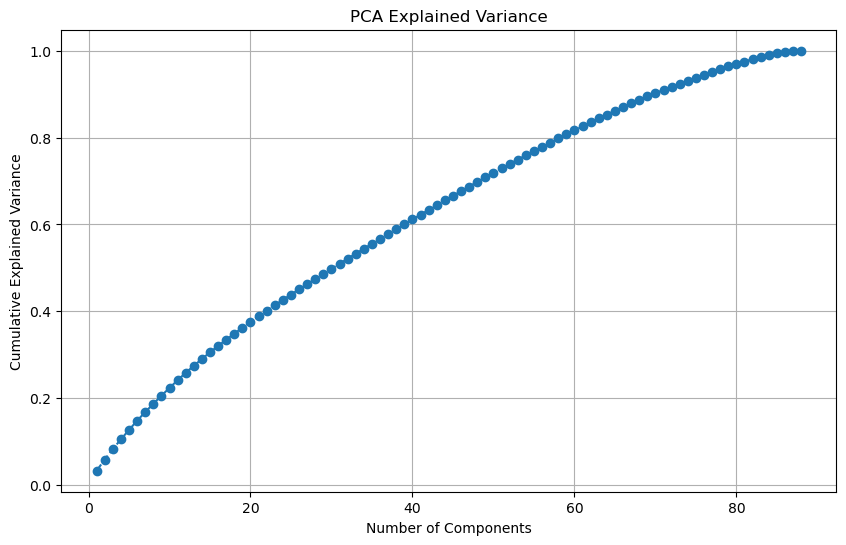

In [38]:
# Apply PCA
pca = PCA()
pca.fit(X_standardized)

# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         np.cumsum(pca.explained_variance_ratio_), 
         marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid()
plt.show()


In [39]:
# Choosing the number of components that explain 95% variance
explained_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(explained_variance >= 0.95) + 1

print(f'Number of components explaining 95% variance: {n_components}')

Number of components explaining 95% variance: 77


In [55]:
# preprocessing the test dataframe
df_test = df_test.ffill()
df_test = df_test.bfill()

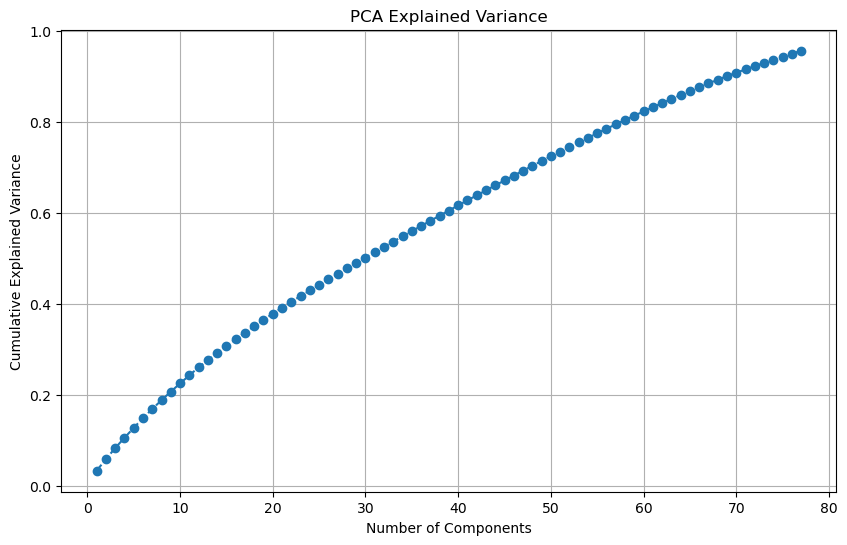

In [61]:
X_train = df_filled.drop(columns=['row_id', 'target']) 
y_train = df_filled['target']
X_test = df_test.drop(columns=['row_id'])

scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X_train)
X_test_standardized = scaler.transform(X_test)

# Applying PCA to Training Data with 95% variance explained 
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_standardized)

# Applying PCA to Test Data
X_test_pca = pca.transform(X_test_standardized)

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), 
         np.cumsum(pca.explained_variance_ratio_), 
         marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid()
plt.show()

# DataFrame for the reduced data
df_train_pca = pd.DataFrame(X_train_pca, columns=[f'PC{i+1}' for i in range(X_train_pca.shape[1])])
df_train_pca['target'] = y_train.values

df_test_pca = pd.DataFrame(X_test_pca, columns=[f'PC{i+1}' for i in range(X_test_pca.shape[1])])
df_test_pca['row_id'] = df_test['row_id'].values


In [65]:
# Observing newly created dataframes
print(len(df_train_pca.columns), len(df_test_pca.columns))
df_train_pca.head()

78 78


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,target
0,1.17,2.80,-1.68,2.18,0.55,-0.97,3.73,-3.36,-0.98,1.11,-1.33,-2.20,0.89,-0.35,0.45,-0.21,-0.53,-2.34,0.44,0.13,-1.21,0.62,0.42,1.71,-0.90,-0.63,0.23,-0.09,-0.29,1.38,-1.57,0.06,-0.57,0.30,-0.38,-1.28,1.63,-0.36,0.48,-1.01,0.52,-0.29,1.56,0.38,-0.71,-0.36,0.01,1.01,-1.00,-1.28,-1.31,0.56,0.13,0.50,0.88,0.66,-0.20,0.08,-0.52,0.06,0.69,0.85,-0.49,0.12,-1.16,-0.45,0.78,0.19,-0.03,0.72,1.06,-0.31,-1.60,-1.83,-2.02,0.99,-0.81,-0.08
1,1.04,1.50,-0.35,-0.55,0.09,0.75,2.53,-1.96,1.15,-1.63,-1.51,-0.42,0.84,-1.27,1.36,-0.09,0.11,-0.61,-0.45,0.67,-0.61,0.64,-0.09,1.39,-1.31,1.29,1.27,0.34,-0.58,0.13,0.12,-0.14,-0.20,-1.00,0.40,-0.13,1.20,-0.54,-1.78,-1.20,-1.06,-0.78,1.99,0.21,-1.13,-0.51,0.94,1.85,2.58,-1.06,-1.08,-0.86,-1.49,-0.34,0.67,0.44,0.25,0.06,-0.02,0.22,0.99,0.76,0.03,-1.11,0.34,0.26,-0.10,0.34,1.41,0.21,-0.85,-0.24,-1.12,-2.23,-2.42,0.82,0.57,0.06
2,-1.29,3.52,-1.25,0.29,1.63,-1.73,0.18,-1.16,1.27,1.00,-0.10,2.65,1.41,0.83,-0.54,-0.07,-0.92,0.35,0.51,0.46,-1.14,1.80,0.18,0.58,-0.71,-0.03,0.05,-0.10,0.76,1.14,-0.58,-0.62,0.30,1.16,0.25,-0.92,0.71,0.06,-0.08,-0.80,0.62,1.74,1.65,1.39,-0.77,-0.69,1.04,0.13,-0.51,-1.35,-0.54,0.13,-0.19,0.35,1.61,0.29,-1.44,-0.39,-0.46,-0.91,-0.69,1.33,-1.81,0.47,0.09,-0.32,-0.15,-0.35,-0.74,-0.29,1.01,0.91,-1.25,-1.65,-2.88,1.57,0.29,0.00
3,0.06,1.46,0.19,0.73,1.78,-1.16,1.83,-0.84,0.86,-1.57,-0.94,-1.35,0.92,-0.99,-0.95,-0.45,0.14,-0.17,0.61,-1.22,-1.14,2.11,0.51,0.73,0.95,-0.34,-0.59,0.97,-0.58,-0.26,1.39,-0.67,-0.03,1.07,-0.76,-1.24,1.25,-0.80,-1.03,-0.18,-0.10,0.32,0.48,2.50,-0.80,-1.10,0.54,-0.20,0.92,-1.91,-2.02,1.22,-2.11,-0.18,0.77,0.60,0.45,0.31,-0.50,-0.02,1.42,1.79,-0.98,-0.06,0.11,1.54,0.14,-0.61,0.59,0.21,0.19,0.04,0.05,-2.64,-2.64,1.56,0.27,-0.03
4,-2.78,0.10,0.59,-1.34,1.87,-1.67,-0.20,-0.02,-0.47,-0.91,-0.51,-0.36,1.17,-0.02,0.32,-1.72,0.90,0.40,1.75,-0.24,-1.49,2.30,-0.62,0.80,-0.74,-0.43,0.27,0.39,1.63,-0.37,-0.40,-0.53,1.49,0.46,0.24,-0.92,1.45,-0.52,0.49,-0.02,0.03,0.22,1.09,1.80,-0.70,-0.78,1.69,-0.53,-0.60,-0.37,-0.11,0.47,0.15,-0.04,-0.31,1.06,0.58,-0.21,-0.11,0.83,1.58,-0.12,-0.59,-0.04,0.85,0.65,0.30,1.25,0.75,-0.88,0.44,0.22,-2.00,-1.67,-2.28,0.76,0.13,0.06


## Model Training and Testing

- Trained and tested a large variety of regression models to determine which would provide the best results.
- Due to the temporal nature of the data, the order of the data must be maintained - this would be violated if we use k-fold cross validation - the alternative is to use the TimeSeriesSplit() which is essentially identical to k-fold cross validation, except that it doesn't lead to shuffling of data.
- Metric used : Mean Squared Error
- The models are trained and used to generate the required csv file for submission.
- Machine Learning Models considered:
    - Linear Regression 
    - Lasso Regression
    - Ridge Regression
    - Bayesian Ridge Regression
    - Random Forest
    - SVR
    - ElasticNet
    - XGBoost
    - LightGBM
- Apart from these, ensemble models were also trained - creating a voting and stacking regressor with 3 base models each.
- A simple neural network and recurrent neural network was also designed and trained for the task on Google Colab - however, due to poor performance it was not used in submissions and hence is excluded from this notebook.
- The final submission was made using the results from the Bayesian Ridge Regression model.
    

In [66]:
# Prepare the data
X = df_train_pca.drop(['target'], axis=1)
y = df_train_pca['target']

# Models dictionary
models = {
    'Linear Regression': LinearRegression(),
    'Lasso Regression': Lasso(alpha=0.1, random_state=42),
    'Ridge Regression': Ridge(alpha=1.0, random_state=42),
    'ElasticNet': ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'SVR': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'XGBoost': xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'LightGBM': lgb.LGBMRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
}

# Using TimeSeriesSplit for cross-validation
cv = TimeSeriesSplit(n_splits=5)

# Perform cross-validation
cv_results = {}
for name, model in models.items():
    scores = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')
    mse_scores = -scores
    cv_results[name] = mse_scores

print("Cross-Validation Results (MSE):")
for name, scores in cv_results.items():
    print(f"{name:20} - Mean: {scores.mean():.4f}, Std: {scores.std():.4f}")

best_model = min(cv_results, key=lambda x: cv_results[x].mean())
print(f"\nBest Model: {best_model}")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19635
[LightGBM] [Info] Number of data points in the train set: 17577, number of used features: 77
[LightGBM] [Info] Start training from score 0.000118
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19635
[LightGBM] [Info] Number of data points in the train set: 35150, number of used features: 77
[LightGBM] [Info] Start training from score 0.000882
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016121 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19635
[LightGBM] [Info] Number of data points in the train set: 52723, number of used features: 77
[LightGBM] [Info] Start 

In [72]:
X_test = df_test_pca.drop(columns=['row_id'])

# Function to make predictions and save to CSV
def save_predictions(model, model_name, X_test, df_test, output_dir="/Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/"):
    Y_test_pred = model.predict(X_test)
    df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': Y_test_pred})
    
    filename = f"{output_dir}predictions_{model_name}.csv"
    df_output.to_csv(filename, index=False)
    
    print(f"Predictions for {model_name} saved in {filename}")

# Generating predictions
for name, model in models.items():
    if (name == "Random Forest"): continue
    model.fit(X, y)
    save_predictions(model, name, X_test, df_test)


Predictions for Linear Regression saved in /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_Linear Regression.csv
Predictions for Lasso Regression saved in /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_Lasso Regression.csv
Predictions for Ridge Regression saved in /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_Ridge Regression.csv
Predictions for ElasticNet saved in /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_ElasticNet.csv
Predictions for SVR saved in /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_SVR.csv
Predictions for XGBoost saved in /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_XGBoost.csv
[LightGBM] [Info] Auto-choosing col-wise multi-threa

In [69]:
# Ensemble model - Voting Regressor
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

voting_regressor = VotingRegressor([
    ('lr', LinearRegression()),
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('xgb', xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
])

voting_regressor.fit(X_train, y_train)
y_pred = voting_regressor.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print(f"Voting Regressor - Test MSE: {mse:.4f}")


Voting Regressor - Test MSE: 0.0057


In [70]:
# Making predictions using Voting Regressor
voting_pred = voting_regressor.predict(df_test_pca.drop(columns=['row_id']))

df_output_voting = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': voting_pred})

filename_voting = "/Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_voting.csv"
df_output_voting.to_csv(filename_voting, index=False)

print(f"Successfully Saved in File: {filename_voting}")
print("\nFirst few rows of saved predictions:")
display(df_output_voting.head(n=10))

Successfully Saved in File: /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_voting.csv

First few rows of saved predictions:


,row_id,target
0,44,0.00
1,45,0.01
2,46,-0.00
3,47,-0.00
4,48,-0.00
5,49,-0.00
6,50,0.00
7,51,0.01
8,52,-0.00
9,53,-0.00


In [ ]:
# Ensemble model - Stacking Regressor
base_models = [
    ('lr', LinearRegression()),
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('xgb', xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42))
]

meta_model = Ridge()

stacking_regressor = StackingRegressor(
    estimators=base_models,
    final_estimator=meta_model
)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)
stacking_regressor.fit(X_train, y_train)
y_pred = stacking_regressor.predict(X_test)

# Finding the MSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)
print(f"Stacking Regressor - Test MSE: {mse:.4f}")

In [ ]:
# Making predictions using Stacking Regressor
stacking_pred = stacking_regressor.predict(df_test_pca.drop(columns=['row_id']))

df_output_stacking = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': stacking_pred})

filename_stacking = "/Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_stacking.csv"
df_output_stacking.to_csv(filename_stacking, index=False)

print(f"Successfully Saved in File: {filename_stacking}")
print("\nFirst few rows of saved predictions:")
display(df_output_stacking.head(n=10))


In [ ]:
X = df_train_pca.drop(columns=['target'])
y = df_train_pca['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle= False)

# Bayesian Ridge Regression Model
bayesian_ridge_model = BayesianRidge()
bayesian_ridge_model.fit(X_train, y_train)

# Predictions
y_pred = bayesian_ridge_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

def save_predictions(model, model_name, X_test, df_test, output_dir="/Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/"):
    Y_test_pred = model.predict(X_test)
    df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': Y_test_pred})
    
    filename = f"{output_dir}predictions_{model_name}.csv"
    df_output.to_csv(filename, index=False)
    
    print(f"Predictions for {model_name} saved in {filename}")

# Generating predictions and storing in CSV file
X_test = df_test_pca.drop(columns=['row_id'])
save_predictions(bayesian_ridge_model, "bayesian_ridge_model_1", X_test, df_test_pca)

Mean Squared Error: 0.005705889239412185
Predictions for bayesian_ridge_model_1 saved in /Users/anjaneyabajaj/Documents/trexquant/trexquant-2025-summer-intern-challenge-bits-pilani/predictions_bayesian_ridge_model_1.csv
